# Shapefile with geopandas

In [4]:
import geopandas as gpd # python 3.9.6 works
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import pandas as pd

# import shapefiles for the USDA zones and US states
shapefile = gpd.read_file('../data/phzm_us_zones_shp_2023/phzm_us_zones_shp_2023.shp')
us_states = gpd.read_file('../data/cb_2018_us_state_500k/cb_2018_us_state_500k.shp')
us_interstates = gpd.read_file('../data/USA_Freeway_System/USA_Freeway_System.shp')

# Import images per redistribution condition 
img1 = plt.imread('../images/oregonstate_logo.png')
img2 = plt.imread('../images/usda_logo_white.png')

In [6]:
# remove alaska and other non-contiguous states from the us_states shapefile
us_states = us_states[~us_states['NAME'].isin(
   ['Alaska', 'Hawaii', 'Puerto Rico', 'American Samoa', 'United States Virgin Islands',
    'Commonwealth of the Northern Mariana Islands', 'Guam'])]

# remove interstates in alaska and canada and hawaii from the us_interstates shapefile
from shapely.geometry import LineString, MultiLineString
def has_lat_above_50(geom):
    if geom.geom_type == 'LineString':
        return any(y > 50 for x, y in geom.coords)
    elif geom.geom_type == 'MultiLineString':
        return any(any(y > 50 for x, y in line.coords) for line in geom.geoms)
    return False
us_interstates = us_interstates[~us_interstates['geometry'].apply(has_lat_above_50)]
# remove interstates west of longitude -130
us_interstates = us_interstates[~us_interstates['geometry'].apply(lambda geom:
    any(x < -130 for x, y in geom.coords) if geom.geom_type == 'LineString' else
    any(any(x < -130 for x, y in line.coords) for line in geom.geoms) if geom.geom_type == 'MultiLineString' else False
)]

In [3]:
# Assign a color to each zone
zone_colors = {'3a': '#fa9fb5',
'3b': '#c51b8a',
'4a': '#bcbddc',
'4b': '#756bb1',
'5a': '#9ecae1',
'5b': '#3182bd',
'6a': '#c2e699',
'6b': '#78c679',
'7a': '#31a354',
'7b': '#006837',
'8a': '#ffffd4',
'8b': '#fee391',
'9a': '#fec44f',
'9b': '#fe9929',
'10a': '#ec7014',
'10b': '#cc4c02',
'11a': '#8c2d04',
'11b': '#e31a1c',
'12a': '#b10026'}

def zone_to_color(zone):
   """
   Map each zone to the hex color in zone_colors
   Default to white if zone not found
   """
   return zone_colors.get(zone, 'white')

df = shapefile.copy()
df['color'] = df['zone'].apply(zone_to_color)

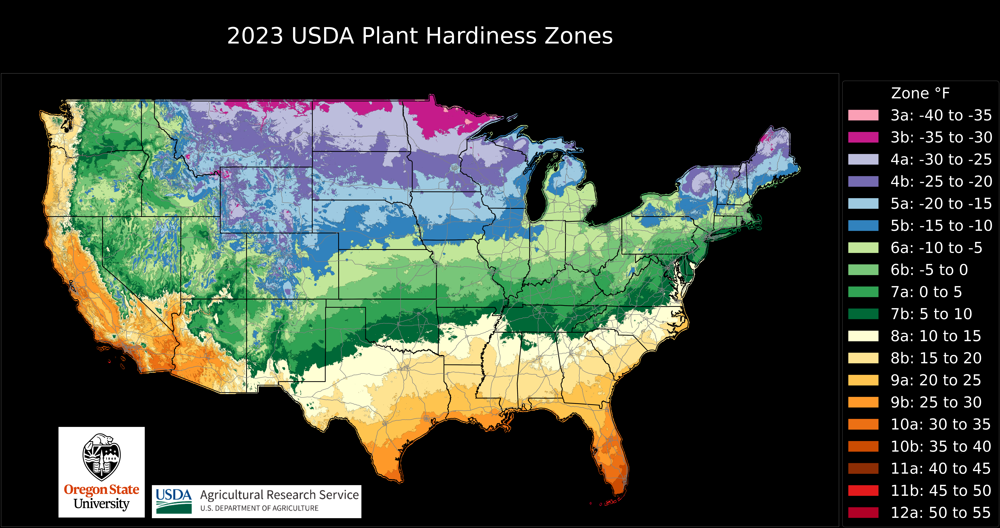

In [ ]:
# Plot the zones
ax2 = df.plot(
   figsize=(100, 100),
   # column='zone',
   color=df['color'],
   edgecolor='black',
   linewidth=0.1
)

# Overlay the US states boundaries
us_states.boundary.plot(ax=ax2, color='black', linewidth=5)

# Overlay the US interstate highways
us_interstates.plot(ax=ax2, color='grey', linewidth=3)

# Remove ticks from the image and add a title
ax2.set_xticks([])
ax2.set_yticks([])
plt.title('\n2023 USDA Plant Hardiness Zones\n', size=150)

# Add a legend for the zone colors using zonetitle
handles = [
   mpatches.Patch(color=zone_colors[zone], label=zonetitle)
   for zone, zonetitle in zip(df['zone'], df['zonetitle'])
]
ax2.legend(
   handles=handles,
   title="Zone °F",
   bbox_to_anchor=(1.2, 1),
   prop={'size': 100},
   title_fontsize=100
)

# Add img1 to the bottom left
newax1 = ax2.inset_axes([0.02, 0.02, 0.2, 0.2], transform=ax2.transAxes)
newax1.imshow(img1)
newax1.axis('off')
# Add img2 right next to img1
newax2 = ax2.inset_axes([0.18, -.07, .25, .25], transform=ax2.transAxes) 
newax2.imshow(img2)
newax2.axis('off')

plt.show()